In [1]:
! pip install -q kaggle

In [2]:
! pip install opencv-python

In [3]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"minojsos","key":"4c61d1db040b01096a2a311efc28dd3d"}'}

In [4]:
! mkdir ~/.kaggle

In [5]:
! cp kaggle.json ~/.kaggle/

In [6]:
! chmod 600 ~/.kaggle/kaggle.json

In [7]:
! kaggle datasets download -d anshulm257/rice-disease-dataset

Dataset URL: https://www.kaggle.com/datasets/anshulm257/rice-disease-dataset
License(s): unknown
 99% 0.98G/0.99G [00:13<00:00, 84.3MB/s]
100% 0.99G/0.99G [00:13<00:00, 79.4MB/s]


In [8]:
! unzip rice-disease-dataset.zip

Archive:  rice-disease-dataset.zip
  inflating: Rice_Leaf_AUG/Bacterial Leaf Blight/20231006_164208.jpg  
  inflating: Rice_Leaf_AUG/Bacterial Leaf Blight/IMG_20231014_172818.jpg  
  inflating: Rice_Leaf_AUG/Bacterial Leaf Blight/IMG_20231014_172819.jpg  
  inflating: Rice_Leaf_AUG/Bacterial Leaf Blight/IMG_20231014_172829.jpg  
  inflating: Rice_Leaf_AUG/Bacterial Leaf Blight/IMG_20231014_172829_1.jpg  
  inflating: Rice_Leaf_AUG/Bacterial Leaf Blight/IMG_20231014_172830.jpg  
  inflating: Rice_Leaf_AUG/Bacterial Leaf Blight/IMG_20231014_172838.jpg  
  inflating: Rice_Leaf_AUG/Bacterial Leaf Blight/IMG_20231014_172840.jpg  
  inflating: Rice_Leaf_AUG/Bacterial Leaf Blight/IMG_20231014_172841.jpg  
  inflating: Rice_Leaf_AUG/Bacterial Leaf Blight/IMG_20231014_172843.jpg  
  inflating: Rice_Leaf_AUG/Bacterial Leaf Blight/IMG_20231014_172845.jpg  
  inflating: Rice_Leaf_AUG/Bacterial Leaf Blight/IMG_20231014_172849.jpg  
  inflating: Rice_Leaf_AUG/Bacterial Leaf Blight/IMG_20231014_17285

The dataset being used: https://www.kaggle.com/datasets/anshulm257/rice-disease-dataset/data
The dataset contains the following classes that will also e used for classification:
* Bacterial Leaf Blight
* Sheath Blight
* Leaf Scald
* Healthy Rice Leaf

In [9]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, ResNet50, InceptionV3
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd
import os
import numpy as np
from glob import glob
import cv2

The dataset can be loaded into a pandas dataframe so that it can be used with an ImageDataGenerator and flow_from_dataframe function.

In [10]:
data_dir = "/content/Rice_Leaf_AUG"

# Gather all images and labels
image_paths = glob(os.path.join(data_dir, "*/*.jpg"))  # Adjust for actual image extensions (e.g., .png)
labels = [os.path.basename(os.path.dirname(path)) for path in image_paths]

In [11]:
# Create a dataframe for easy splitting
data = pd.DataFrame({
    'filepath': image_paths,
    'label': labels
})

data.head(5)

,filepath,label
0,/content/Rice_Leaf_AUG/Sheath Blight/aug_0_988...,Sheath Blight
1,/content/Rice_Leaf_AUG/Sheath Blight/Sheath_Bl...,Sheath Blight
2,/content/Rice_Leaf_AUG/Sheath Blight/aug_0_806...,Sheath Blight
3,/content/Rice_Leaf_AUG/Sheath Blight/IMG_20231...,Sheath Blight
4,/content/Rice_Leaf_AUG/Sheath Blight/aug_0_901...,Sheath Blight


In [12]:
data = data[data.label != 'Brown Spot']
data = data[data.label != 'Leaf Blast']

In [13]:
data['label'].value_counts()

,count
label,
Healthy Rice Leaf,653
Bacterial Leaf Blight,636
Sheath Blight,632
Leaf scald,628


It is evident from the above that the dataset is not very imbalanced and instead is almost very balanced and therefore requires no augmentation to be applied to fix any imbalances.

# Exploratory Data Analysis

<ipython-input-13-22e51abbc335>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_counts.index, y=class_counts.values, palette="viridis")


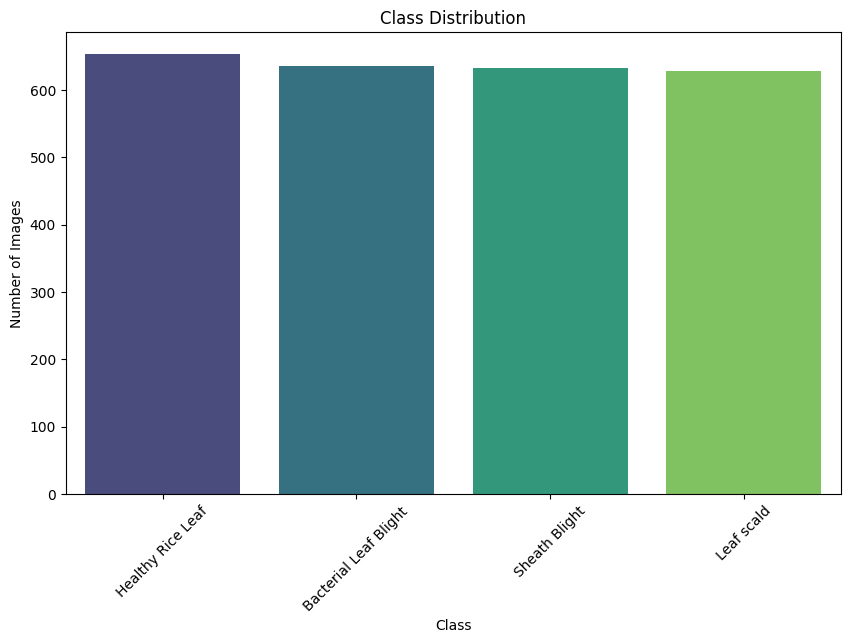

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot class distribution
class_counts = data['label'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(x=class_counts.index, y=class_counts.values, palette="viridis")
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.show()

It is important to ensure that the images follow similar dimensions so that resizing when preprocessing the data will not affect it excessively losing it's Aspect Ratio.

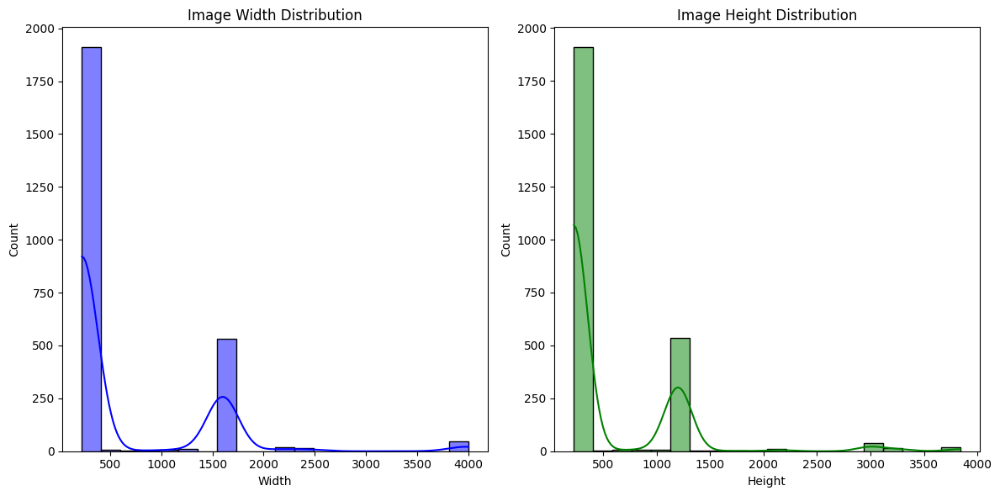

In [ ]:
from PIL import Image

# Collect image dimensions
dimensions = [Image.open(path).size for path in data['filepath']]
widths, heights = zip(*dimensions)

# Plot distributions
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(widths, bins=20, kde=True, color='blue')
plt.title("Image Width Distribution")
plt.xlabel("Width")

plt.subplot(1, 2, 2)
sns.histplot(heights, bins=20, kde=True, color='green')
plt.title("Image Height Distribution")
plt.xlabel("Height")

plt.tight_layout()
plt.show()

Plot some of the images present in the dataset across all the different classes to understand what they look like. This helps to decide on any particular preprocessing steps that might be needed in the latter part of the process.

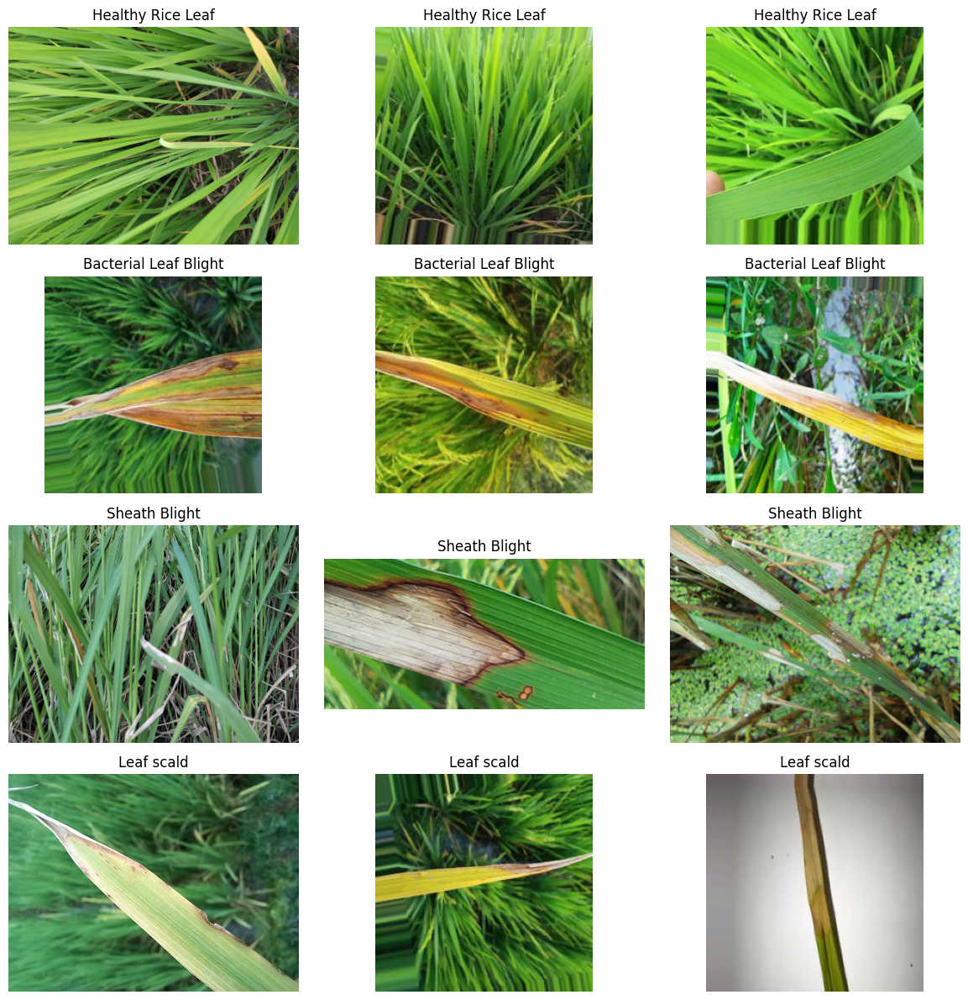

In [ ]:
import random

def plot_sample_images(df, classes, num_samples=3):
    plt.figure(figsize=(12, len(classes) * 3))
    for i, class_name in enumerate(classes):
        class_samples = df[df['label'] == class_name].sample(num_samples, random_state=42)
        for j, path in enumerate(class_samples['filepath']):
            img = Image.open(path)
            plt.subplot(len(classes), num_samples, i * num_samples + j + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(class_name)
    plt.tight_layout()
    plt.show()

# Plot sample images
plot_sample_images(data, class_counts.index, num_samples=3)

Since the dataset contains balanced images due to augmentation already being performed, we can check if there are too many duplicate images. If there is not a lot, then we can go ahead with the dataset. If it's too many, then they need to be removed.<br>
In this case since there are only 14 images that are considered duplicates, they can be left in as is. There is no need to remove these images.

In [ ]:
from hashlib import md5

# Compute image hashes
def compute_hashes(filepaths):
    hashes = []
    for path in filepaths:
        with open(path, 'rb') as f:
            img_hash = md5(f.read()).hexdigest()
        hashes.append(img_hash)
    return hashes

# Detect duplicates
data['hash'] = compute_hashes(data['filepath'])
duplicates = data[data.duplicated('hash', keep=False)].sort_values('hash')

# Display duplicate counts
print(f"Number of duplicate images: {duplicates.shape[0]}")

Number of duplicate images: 14


We can try to perform some simple segmentation technique to see if we can only segment the leaf from the entire dataset. This is using classical segmentation techniques due to deep learning requiring more data and masks to perform segmentation which is currently unavailable. We try out Otsu's Thresholding for segmentation purposes to udnerstand if it is capable of segmenting the leaf properly while retaining very little of the background. This can effectively remove noise.

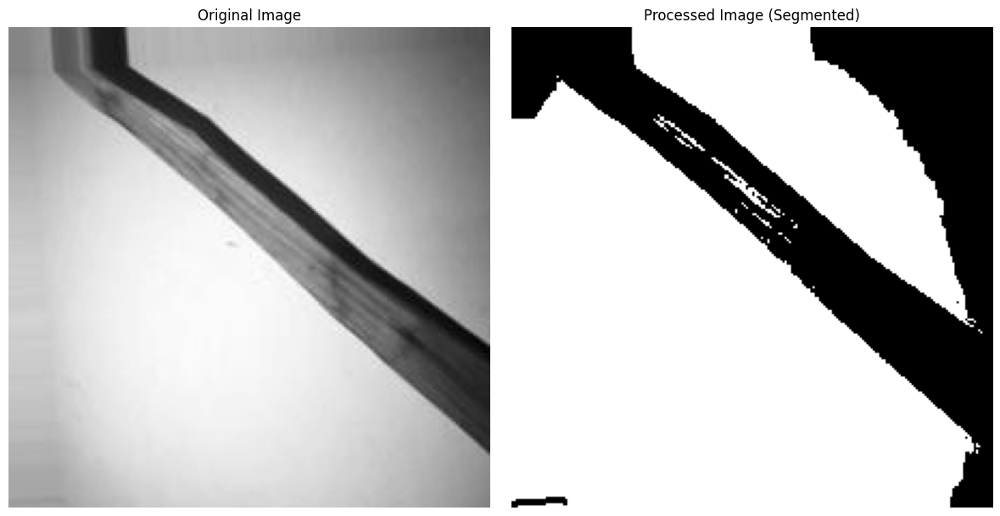

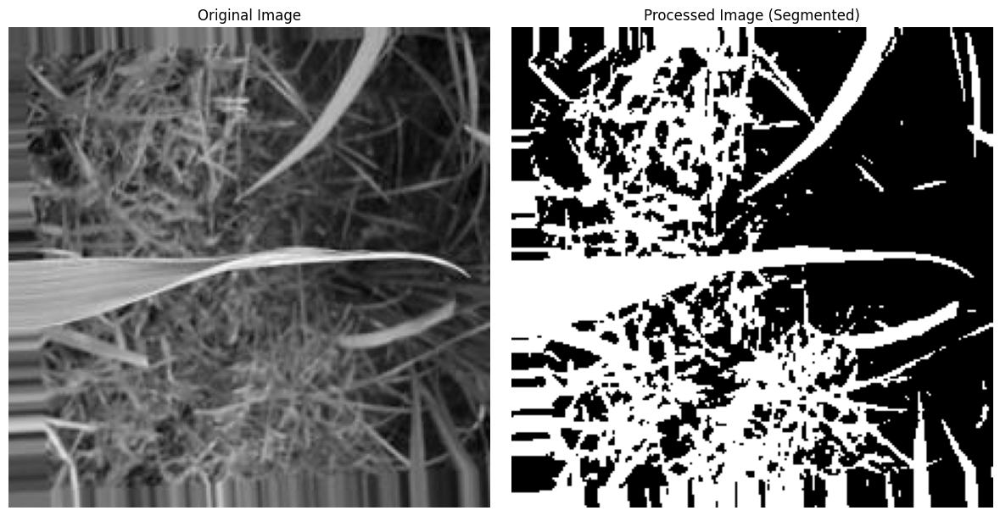

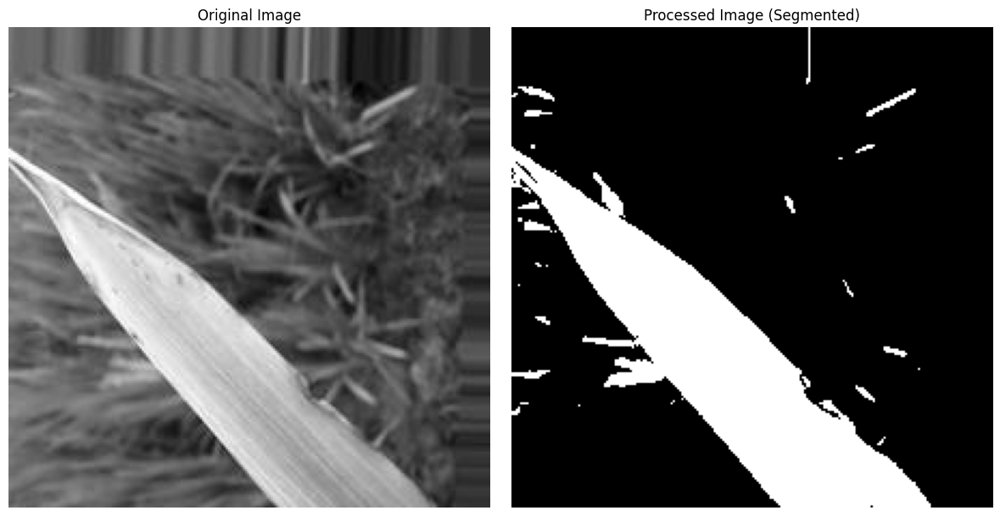

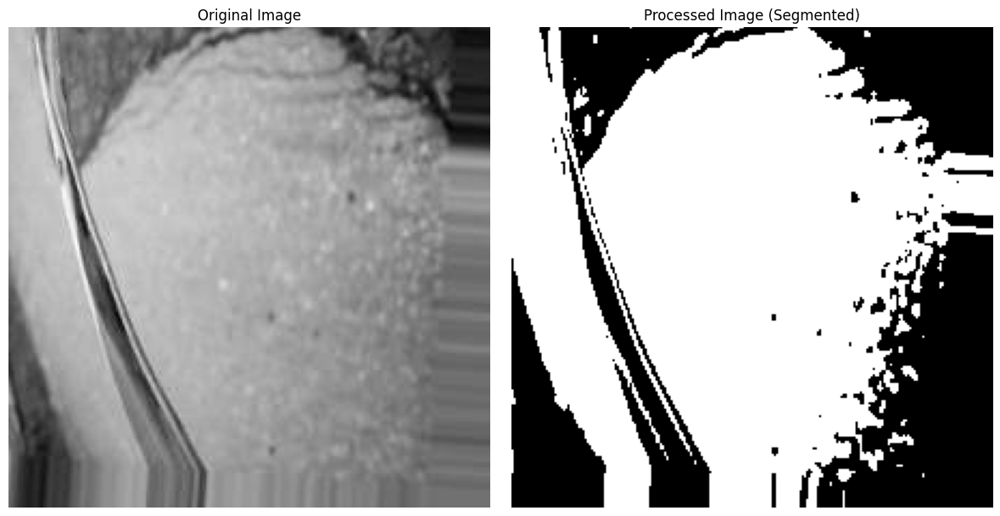

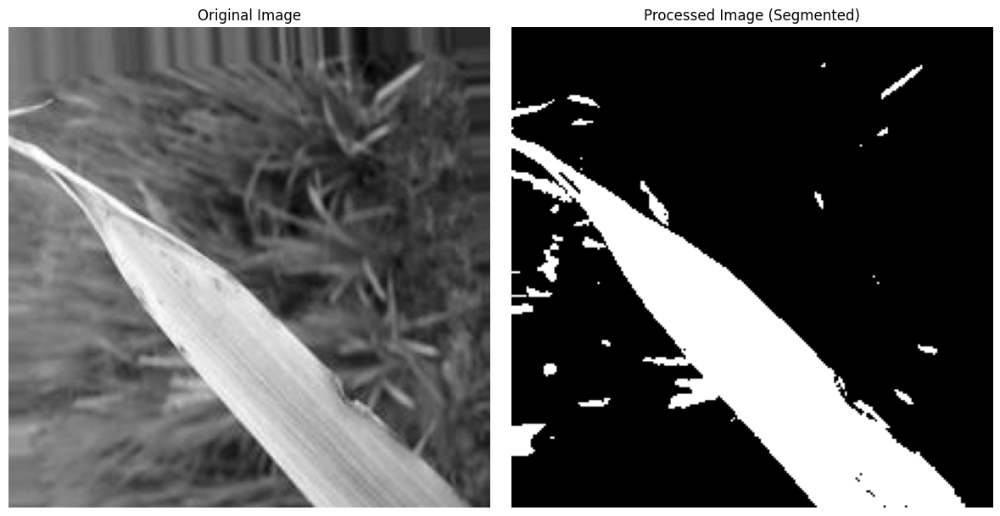

...

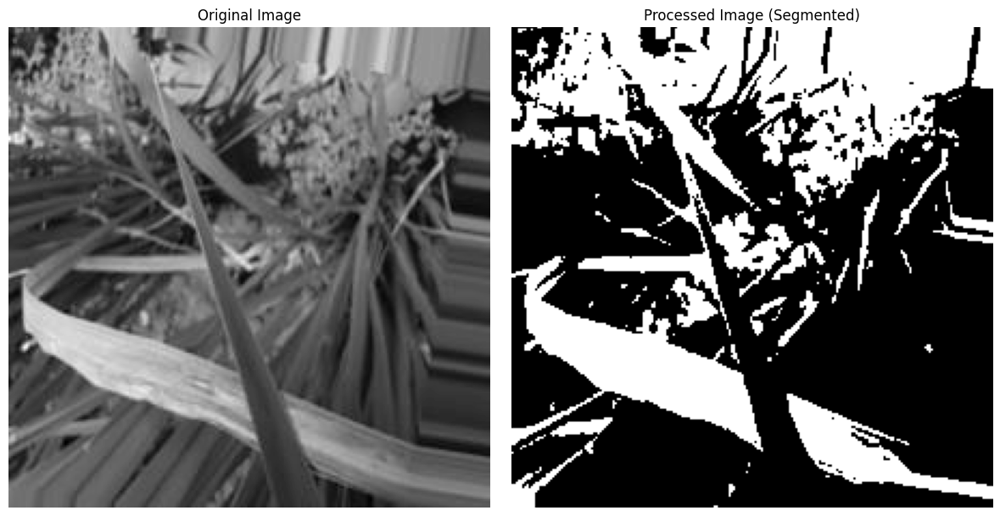

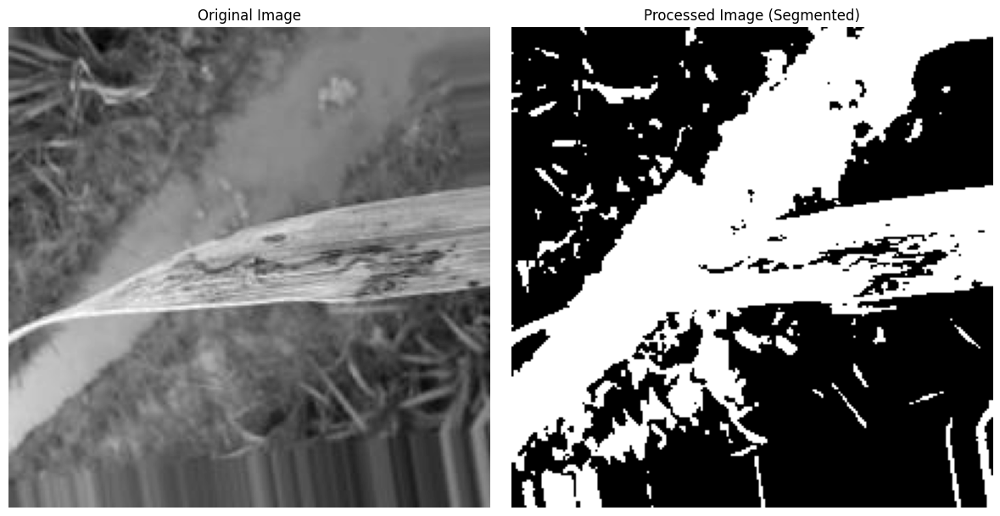

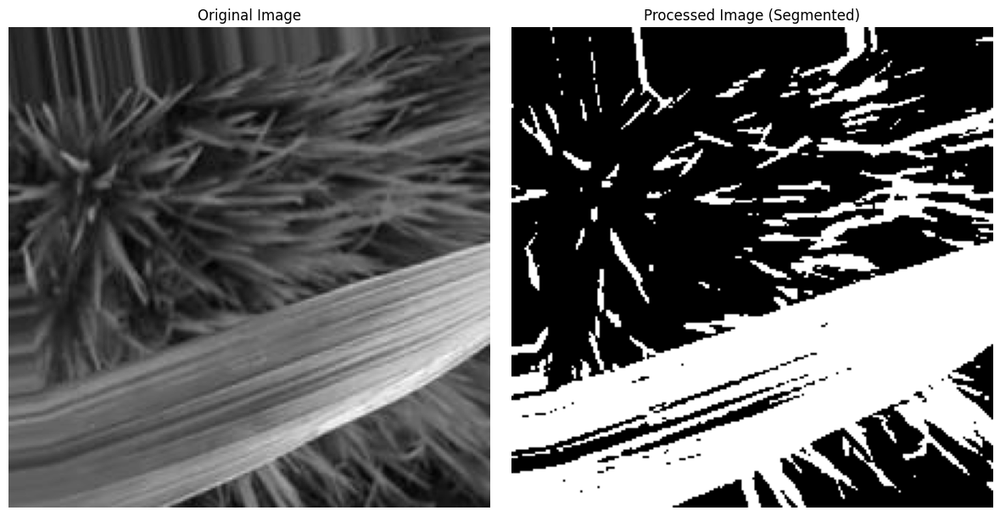

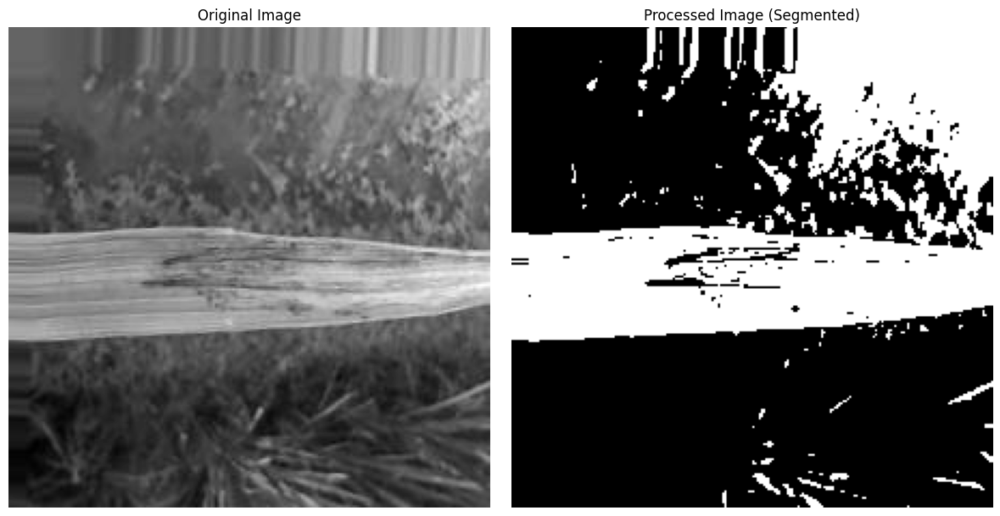

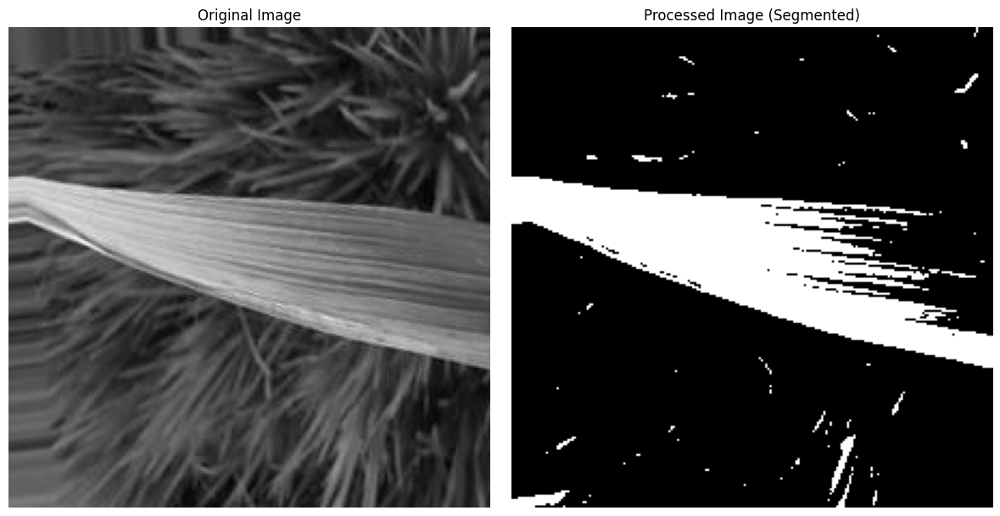

In [ ]:
import matplotlib.pyplot as plt
import cv2

# Load the image
file_paths = []
for index, row in data.iterrows():
  file_paths.append(row['filepath'])
  if index == 10:
    break

for file_path in file_paths:
  # Load the original image
  image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)

  # Processed image (e.g., segmentation result)
  # Example: Apply Otsu's Thresholding
  _, segmented_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

  # Plot both images
  plt.figure(figsize=(12, 6))

  # Original image
  plt.subplot(1, 2, 1)
  plt.imshow(image, cmap='gray')
  plt.title('Original Image')
  plt.axis('off')

  # Segmented/Processed image
  plt.subplot(1, 2, 2)
  plt.imshow(segmented_image, cmap='gray')
  plt.title('Processed Image (Segmented)')
  plt.axis('off')

  plt.tight_layout()
  plt.show()

Another type of segmentation algorithm is called Watershed which is applied below to compare it against Otsu's Thresholding

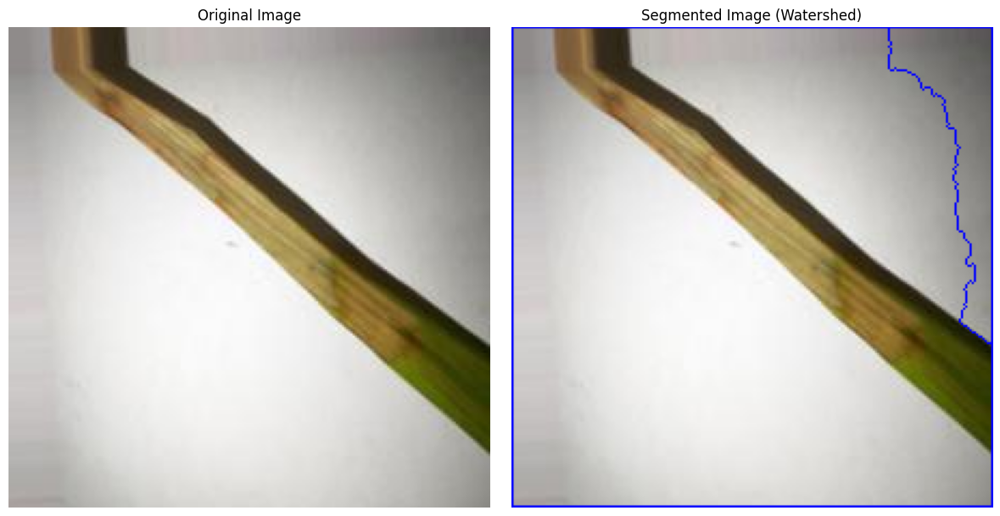

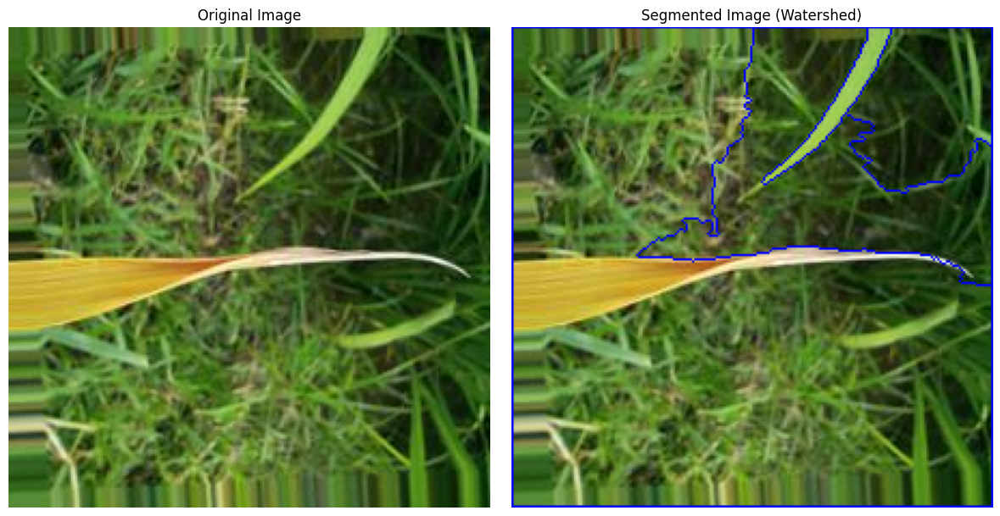

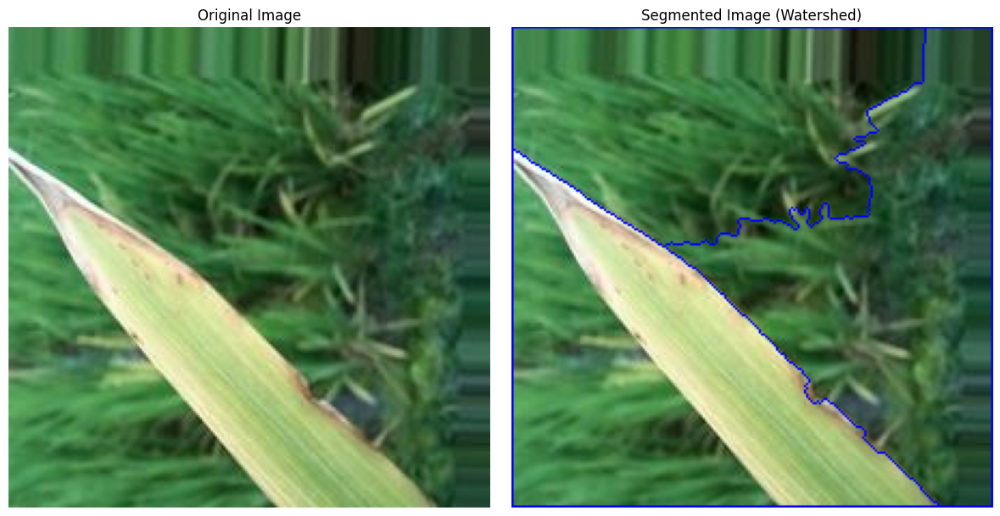

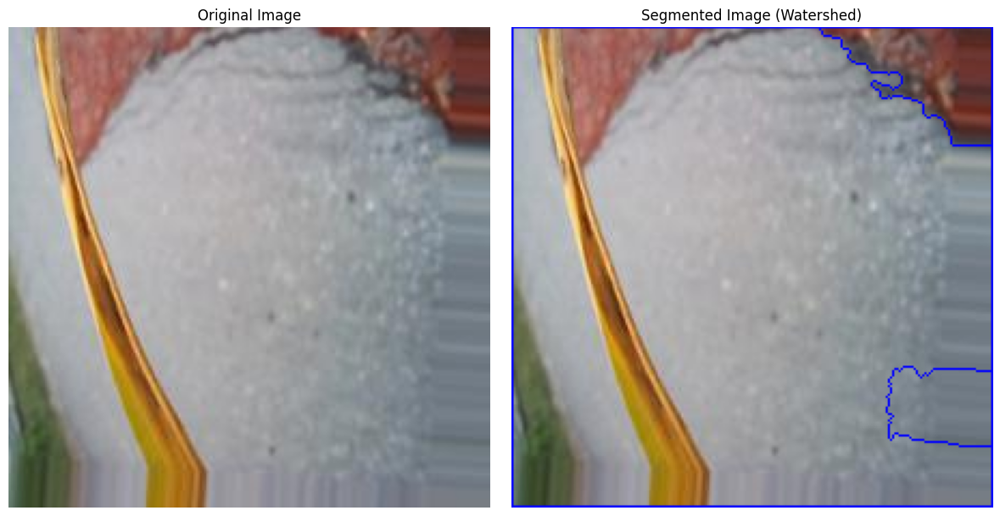

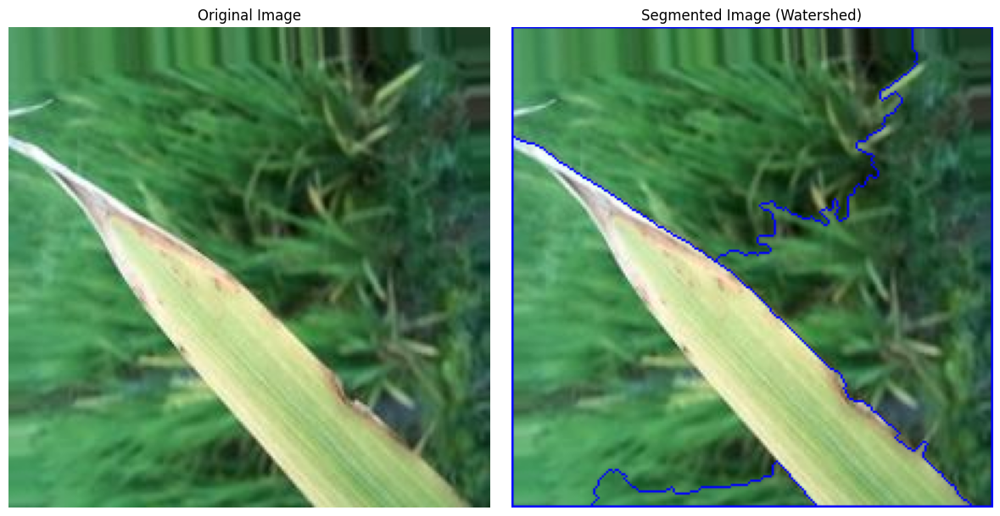

...

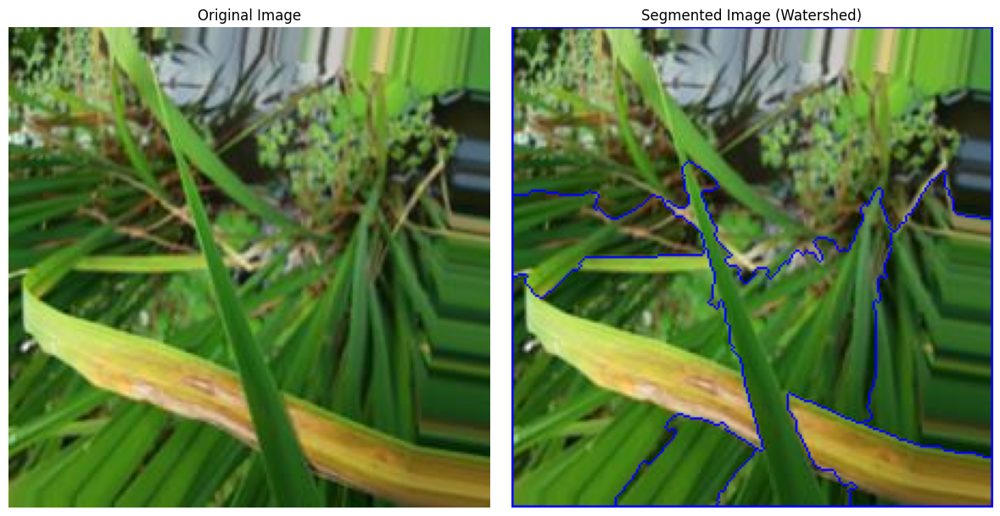

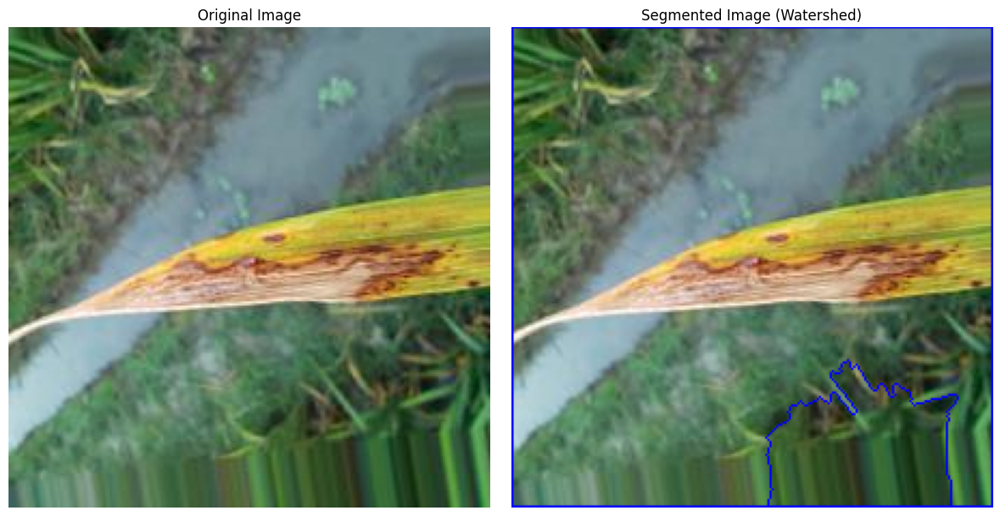

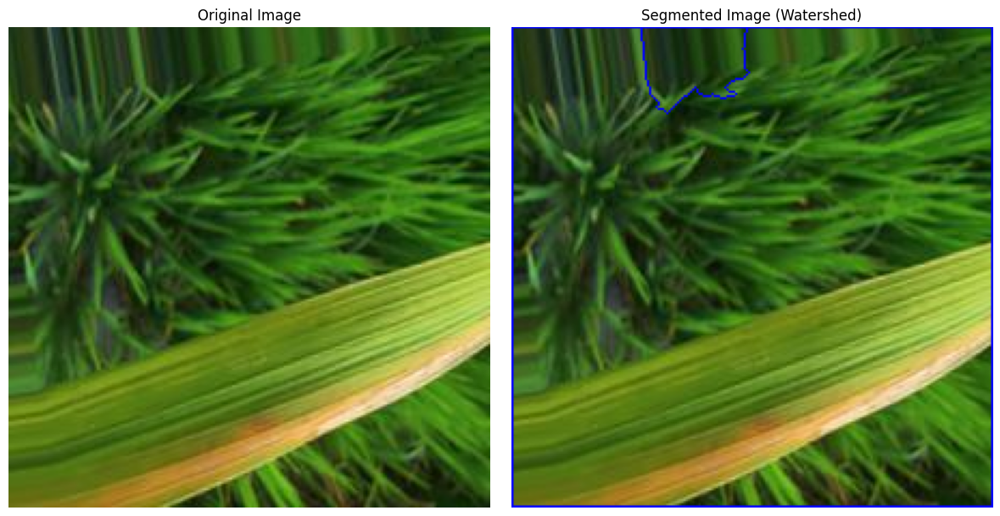

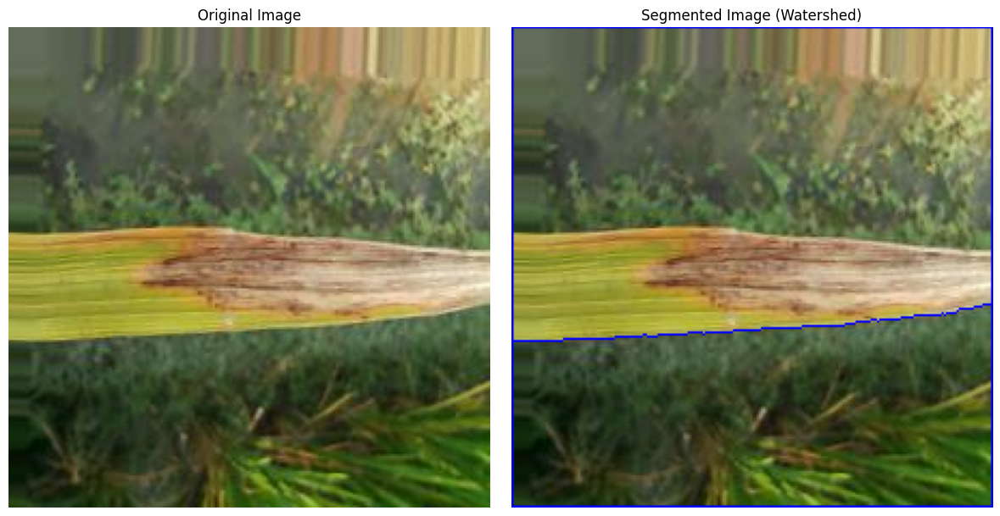

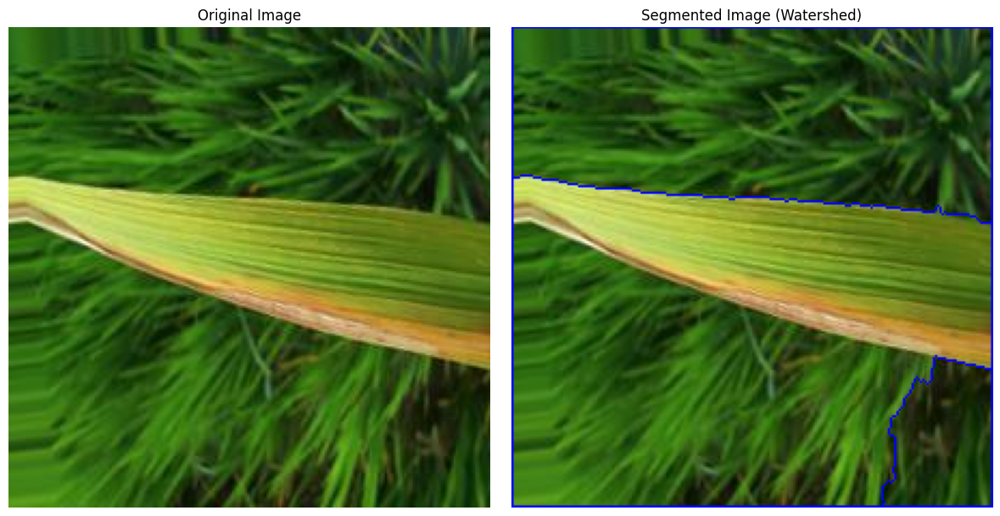

In [ ]:
for file_path in file_paths:
  # Load the original image
  image = cv2.imread(file_path)
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # Step 1: Apply Otsu's Thresholding to get the binary image
  _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

  # Step 2: Morphological Operations to get sure background and sure foreground
  kernel = np.ones((3, 3), np.uint8)
  sure_bg = cv2.dilate(thresh, kernel, iterations=3)  # Sure background
  dist_transform = cv2.distanceTransform(thresh, cv2.DIST_L2, 5)
  _, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)  # Sure foreground

  # Step 3: Unknown region
  sure_fg = np.uint8(sure_fg)
  unknown = cv2.subtract(sure_bg, sure_fg)

  # Step 4: Marker labelling
  _, markers = cv2.connectedComponents(sure_fg)
  markers = markers + 1
  markers[unknown == 255] = 0

  # Step 5: Apply the Watershed algorithm
  markers = cv2.watershed(image, markers)
  segmented_image = image.copy()
  segmented_image[markers == -1] = [255, 0, 0]  # Mark boundaries in red

  # Plot the original and segmented images
  plt.figure(figsize=(12, 6))

  # Original image
  plt.subplot(1, 2, 1)
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
  plt.title('Original Image')
  plt.axis('off')

  # Segmented image
  plt.subplot(1, 2, 2)
  plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
  plt.title('Segmented Image (Watershed)')
  plt.axis('off')

  plt.tight_layout()
  plt.show()

Watershed does not seem to perform as well as Otsu's Thresholding as it seems to be capturing areas outside the main region of focus. Therefore it might not be suitable. But further adjusting of parameters can be explored to identify if it can be fixed. But at this point, Otsu's thresholding seems to perform better out of the two. Other methods can also be explored later if segmentation is required.

# Data Preprocessing
Initially we do not want to perform any additional data processing steps and only split the data into training and testing split. The data is split such that 20% is used for testing while the rest is used for training. The stratify parameter ensures the percentage of labels in the original data is maintained between both train and test to ensure uniformity.

In [14]:
# Split into training and validation sets
train_df, val_df = train_test_split(data, test_size=0.2, stratify=data['label'], random_state=42)

The images are rescaled such that the color codes are all between 0 - 1 instead of being from  0 -255 as it usually is. A batch size of 32 has been used but this can be adjusted depending on the amount memory usage.

In [15]:
# ImageDataGenerator without augmentation
datagen = ImageDataGenerator(rescale=1.0/255)

train_generator = datagen.flow_from_dataframe(
    train_df,
    x_col='filepath',
    y_col='label',
    target_size=(172, 172),
    batch_size=32,
    class_mode='categorical'
)

val_generator = datagen.flow_from_dataframe(
    val_df,
    x_col='filepath',
    y_col='label',
    target_size=(172, 172),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 2039 validated image filenames belonging to 4 classes.
Found 510 validated image filenames belonging to 4 classes.


In [16]:
# Classes
class_names = list(train_generator.class_indices.keys())

# Model Building and Evaluation
Convolutional Neural Networks are mainly used due to their ability to perform well in case of Computer Vision. Both custom architectures based on existing research and pretrained models are explored to identify which performs better. This is determined based on evaluation.

In [17]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.regularizers import l2

## Custom CNN
A Custom CNN Architecture with a rather simple architecture without regularization and only an additional dropout. This will be considered a base model and can be used to understand how well the model will perform in such conditions.

In [18]:
MODEL_NAME = 'custom_cnn_model'
EPOCHS = 20

custom_model = Sequential([
  Conv2D(32, (3, 3), activation='relu', input_shape=(172, 172, 3)),
  MaxPooling2D(2, 2),
  Conv2D(64, (3, 3), activation='relu'),
  MaxPooling2D(2, 2),
  Conv2D(128, (3, 3), activation='relu'),
  MaxPooling2D(2, 2),
  Conv2D(256, (3, 3), activation='relu'),
  MaxPooling2D(2, 2),
  Flatten(),
  Dense(128, activation='relu'),
  Dense(64, activation='relu'),
  Dropout(0.5),
  Dense(len(class_names), activation='softmax')
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [19]:
custom_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 170, 170, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 85, 85, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 83, 83, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 41, 41, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 39, 39, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 19, 19, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 17, 17, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       2,097,280 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 4)                   │             260 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,494,212 (9.51 MB)

 Trainable params: 2,494,212 (9.51 MB)

 Non-trainable params: 0 (0.00 B)

In [20]:
# Learning Rate Scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)
# Early Stopping if no Improvement
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
# Save the Best Model when a Best Model is encountered
model_checkpoint = ModelCheckpoint(f'best_{MODEL_NAME}.keras', save_best_only=True)

# Compile the Model using the ADAM Optimizer. Use Accuracy to measure the Model Performance
custom_model.compile(
  optimizer=Adam(),
  loss='categorical_crossentropy',
  metrics=['accuracy']
)

# Begin Training the model
history = custom_model.fit(
  train_generator,
  validation_data=val_generator,
  epochs=EPOCHS,
  callbacks=[lr_scheduler]
)
custom_model.save(f"{MODEL_NAME}.h5")

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


64/64 ━━━━━━━━━━━━━━━━━━━━ 37s 428ms/step - accuracy: 0.3683 - loss: 1.2856 - val_accuracy: 0.5902 - val_loss: 0.9226 - learning_rate: 0.0010
Epoch 2/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 26s 302ms/step - accuracy: 0.5539 - loss: 0.9388 - val_accuracy: 0.5980 - val_loss: 0.8152 - learning_rate: 0.0010
Epoch 3/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 21s 310ms/step - accuracy: 0.5615 - loss: 0.8827 - val_accuracy: 0.6314 - val_loss: 0.7853 - learning_rate: 0.0010
Epoch 4/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 20s 295ms/step - accuracy: 0.6176 - loss: 0.8020 - val_accuracy: 0.6824 - val_loss: 0.6864 - learning_rate: 0.0010
Epoch 5/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 21s 292ms/step - accuracy: 0.6792 - loss: 0.7199 - val_accuracy: 0.6745 - val_loss: 0.6742 - learning_rate: 0.0010
Epoch 6/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 21s 308ms/step - accuracy: 0.6919 - loss: 0.6847 - val_accuracy: 0.7608 - val_loss: 0.5763 - learning_rate: 0.0010
Epoch 7/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 20s 293ms/step - accuracy: 0.7699 - loss: 0.5667 - val_

## Custom CNN w/Complexities

In [23]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization,
    Input, GlobalAveragePooling2D, Add, Activation
)

input_shape=(172, 172, 3)
num_classes=len(class_names)

inputs = Input(shape=input_shape)

# Block 1
x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
x = BatchNormalization()(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)
x = Dropout(0.25)(x)

# Block 2
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)
x = Dropout(0.25)(x)

# Block 3 with residual connection
shortcut = x  # Original shortcut tensor
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)

# Adjust the shortcut to match the shape of x
shortcut = Conv2D(128, (1, 1), strides=1, padding='same')(shortcut)

# Add the shortcut to x
x = Add()([x, shortcut])  # Add residual connection
x = MaxPooling2D((2, 2))(x)
x = Dropout(0.25)(x)

# Block 4
x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)
x = Dropout(0.25)(x)

# Global Average Pooling + Dense Layers
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(num_classes, activation='softmax')(x)

# Define model
custom_model_complex = Model(inputs, outputs)

In [24]:
# Compile the model
custom_model_complex.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print model summary
custom_model_complex.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 172, 172, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 172, 172, 32)   │            896 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 172, 172, 32)   │            128 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 172, 172, 32)   │          9,248 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 172, 172, 32)   │            128 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_4           │ (None, 86, 86, 32)     │              0 │ batch_normalization_1… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 86, 86, 32)     │              0 │ max_pooling2d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 86, 86, 64)     │         18,496 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 86, 86, 64)     │            256 │ conv2d_6[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 86, 86, 64)     │         36,928 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 86, 86, 64)     │            256 │ conv2d_7[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_5           │ (None, 43, 43, 64)     │              0 │ batch_normalization_3… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 43, 43, 64)     │              0 │ max_pooling2d_5[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 43, 43, 128)    │         73,856 │ dropout_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 43, 43, 128)    │            512 │ conv2d_8[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)    

 Total params: 1,251,236 (4.77 MB)

 Trainable params: 1,249,316 (4.77 MB)

 Non-trainable params: 1,920 (7.50 KB)

In [25]:
MODEL_NAME = 'custom_complex_cnn_model'

# Learning Rate Scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)
# Early Stopping if no Improvement
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
# Save the Best Model when a Best Model is encountered
model_checkpoint = ModelCheckpoint(f'best_{MODEL_NAME}.keras', save_best_only=True)

history_custom_complex = custom_model_complex.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    callbacks=[lr_scheduler, model_checkpoint]
)

Epoch 1/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 75s 823ms/step - accuracy: 0.5337 - loss: 1.2967 - val_accuracy: 0.2569 - val_loss: 2.8234 - learning_rate: 0.0010
Epoch 2/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 34s 308ms/step - accuracy: 0.7464 - loss: 0.6485 - val_accuracy: 0.2569 - val_loss: 5.9603 - learning_rate: 0.0010
Epoch 3/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 41s 328ms/step - accuracy: 0.7858 - loss: 0.5644 - val_accuracy: 0.3118 - val_loss: 5.8802 - learning_rate: 0.0010
Epoch 4/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.8211 - loss: 0.4931
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
64/64 ━━━━━━━━━━━━━━━━━━━━ 40s 319ms/step - accuracy: 0.8209 - loss: 0.4930 - val_accuracy: 0.2471 - val_loss: 11.8578 - learning_rate: 0.0010
Epoch 5/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 23s 332ms/step - accuracy: 0.8489 - loss: 0.3894 - val_accuracy: 0.2490 - val_loss: 11.0620 - learning_rate: 5.0000e-04
Epoch 6/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 40s 323ms/step - accuracy: 0.8762 - loss

In [26]:
custom_model_complex.save(f'{MODEL_NAME}.h5')

## Pretrained Models
We need to redefine the generators for pretrained models as they expect a particular input size and in this case it is 128*128 unlike for the custom models. Since the custom models are built by ourselves the input size and the relevant layers can be defined ourseleves and configured accordingly.

In [29]:
# ImageDataGenerator without augmentation
datagen = ImageDataGenerator(rescale=1.0/255)

train_generator = datagen.flow_from_dataframe(
    train_df,
    x_col='filepath',
    y_col='label',
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical'
)

val_generator = datagen.flow_from_dataframe(
    val_df,
    x_col='filepath',
    y_col='label',
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 2039 validated image filenames belonging to 4 classes.
Found 510 validated image filenames belonging to 4 classes.


### VGG16 Model
The VGG 16 Model is used. The pretrained version is used where the model has been already trained on a larger dataset known as imagenet. The input shape is 128*128 and 3 indicates the color channel.The base model is frozen while an additional set of layers are added to allow for classification as required by this task.

In [30]:
MODEL_NAME = 'VGG16'
vgg16_model = VGG16(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
vgg16_model = Sequential([
  vgg16_model,
  GlobalAveragePooling2D(),
  Dense(128, activation='relu'),
  Dropout(0.5),
  Dense(len(class_names), activation='softmax')
])
vgg16_model.trainable = False  # Freeze base model

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [31]:
# Learning Rate Scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)
# Early Stopping if no Improvement
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
# Save the Best Model when a Best Model is encountered
model_checkpoint = ModelCheckpoint(f'best_{MODEL_NAME}.keras', save_best_only=True)

# Compile the Model using the ADAM Optimizer. Use Accuracy to measure the Model Performance
vgg16_model.compile(
  optimizer=Adam(),
  loss='categorical_crossentropy',
  metrics=['accuracy']
)

# Begin Training the model
history_vgg16 = vgg16_model.fit(
  train_generator,
  validation_data=val_generator,
  epochs=EPOCHS,
  callbacks=[lr_scheduler, model_checkpoint]
)
vgg16_model.save(f"{MODEL_NAME}.h5")

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py:75: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")
/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


64/64 ━━━━━━━━━━━━━━━━━━━━ 42s 517ms/step - accuracy: 0.2285 - loss: 1.6483 - val_accuracy: 0.2451 - val_loss: 1.4741 - learning_rate: 0.0010
Epoch 2/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 22s 312ms/step - accuracy: 0.2270 - loss: 1.6072 - val_accuracy: 0.2451 - val_loss: 1.4741 - learning_rate: 0.0010
Epoch 3/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 20s 292ms/step - accuracy: 0.2347 - loss: 1.6335 - val_accuracy: 0.2451 - val_loss: 1.4741 - learning_rate: 0.0010
Epoch 4/20
63/64 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.2217 - loss: 1.6365
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
64/64 ━━━━━━━━━━━━━━━━━━━━ 21s 299ms/step - accuracy: 0.2220 - loss: 1.6367 - val_accuracy: 0.2451 - val_loss: 1.4741 - learning_rate: 0.0010
Epoch 5/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 20s 288ms/step - accuracy: 0.2411 - loss: 1.6361 - val_accuracy: 0.2451 - val_loss: 1.4741 - learning_rate: 5.0000e-04
Epoch 6/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 22s 305ms/step - accuracy: 0.2428 - loss: 1.6494 - va

### InceptionV3

In [32]:
MODEL_NAME = 'InceptionV3'
inceptionv3_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
inceptionv3_model = Sequential([
  inceptionv3_model,
  GlobalAveragePooling2D(),
  Dense(128, activation='relu'),
  Dropout(0.5),
  Dense(len(class_names), activation='softmax')
])
inceptionv3_model.trainable = False  # Freeze base model

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [33]:
# Learning Rate Scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)
# Early Stopping if no Improvement
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
# Save the Best Model when a Best Model is encountered
model_checkpoint = ModelCheckpoint(f'best_{MODEL_NAME}.keras', save_best_only=True)

# Compile the Model using the ADAM Optimizer. Use Accuracy to measure the Model Performance
inceptionv3_model.compile(
  optimizer=Adam(),
  loss='categorical_crossentropy',
  metrics=['accuracy']
)

# Begin Training the model
history_inceptionv3 = inceptionv3_model.fit(
  train_generator,
  validation_data=val_generator,
  epochs=EPOCHS,
  callbacks=[lr_scheduler, model_checkpoint]
)
inceptionv3_model.save(f"{MODEL_NAME}.h5")

Epoch 1/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 49s 582ms/step - accuracy: 0.2572 - loss: 3.5392 - val_accuracy: 0.2784 - val_loss: 2.4628 - learning_rate: 0.0010
Epoch 2/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 58s 307ms/step - accuracy: 0.2712 - loss: 3.3016 - val_accuracy: 0.2784 - val_loss: 2.4628 - learning_rate: 0.0010
Epoch 3/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 41s 299ms/step - accuracy: 0.2478 - loss: 3.3782 - val_accuracy: 0.2784 - val_loss: 2.4628 - learning_rate: 0.0010
Epoch 4/20
63/64 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.2606 - loss: 3.3966
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
64/64 ━━━━━━━━━━━━━━━━━━━━ 40s 286ms/step - accuracy: 0.2604 - loss: 3.3992 - val_accuracy: 0.2784 - val_loss: 2.4628 - learning_rate: 0.0010
Epoch 5/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 21s 311ms/step - accuracy: 0.2427 - loss: 3.4926 - val_accuracy: 0.2784 - val_loss: 2.4628 - learning_rate: 5.0000e-04
Epoch 6/20
64/64 ━━━━━━━━━━━━━━━━━━━━ 40s 294ms/step - accuracy: 0.2834 - loss: 

## Evaluate Model

In [21]:
def evaluate_model(model, generator):
  y_true = generator.classes
  y_pred = np.argmax(model.predict(generator), axis=1)

  print("\nClassification Report:")
  print(classification_report(y_true, y_pred, target_names=class_names))

  print("\nConfusion Matrix:")
  cm = confusion_matrix(y_true, y_pred)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
  disp.plot(cmap=plt.cm.Blues)
  plt.show()

Found 510 validated image filenames belonging to 4 classes.

Simple CNN Model:


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 266ms/step

Classification Report:
                       precision    recall  f1-score   support

Bacterial Leaf Blight       0.77      0.88      0.82       127
    Healthy Rice Leaf       0.98      0.99      0.98       131
           Leaf scald       0.81      0.71      0.75       126
        Sheath Blight       0.86      0.83      0.84       126

             accuracy                           0.85       510
            macro avg       0.85      0.85      0.85       510
         weighted avg       0.85      0.85      0.85       510


Confusion Matrix:


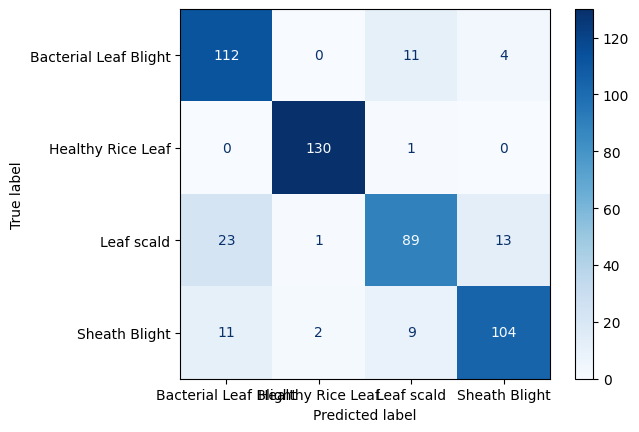

In [22]:
val_generator = datagen.flow_from_dataframe(
    val_df,
    x_col='filepath',
    y_col='label',
    target_size=(172, 172),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Evaluate custom model
print("\nSimple CNN Model:")
evaluate_model(custom_model, val_generator)

Found 510 validated image filenames belonging to 4 classes.
\Complex CNN Model:


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 322ms/step

Classification Report:
                       precision    recall  f1-score   support

Bacterial Leaf Blight       0.89      0.76      0.82       127
    Healthy Rice Leaf       0.99      1.00      1.00       131
           Leaf scald       0.74      0.92      0.82       126
        Sheath Blight       0.94      0.85      0.89       126

             accuracy                           0.88       510
            macro avg       0.89      0.88      0.88       510
         weighted avg       0.89      0.88      0.88       510


Confusion Matrix:


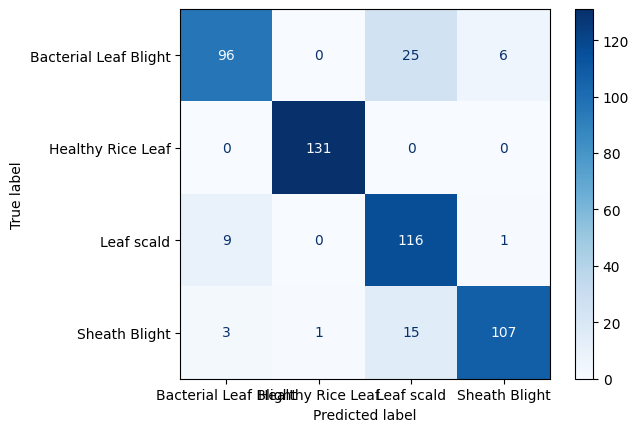

In [34]:
val_generator = datagen.flow_from_dataframe(
    val_df,
    x_col='filepath',
    y_col='label',
    target_size=(172, 172),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Evaluate custom vanilla model
print("\Complex CNN Model:")
evaluate_model(custom_model_complex, val_generator)

Found 510 validated image filenames belonging to 4 classes.

VGG16 Model:


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step

Classification Report:
                       precision    recall  f1-score   support

Bacterial Leaf Blight       0.00      0.00      0.00       127
    Healthy Rice Leaf       0.24      0.85      0.38       131
           Leaf scald       0.00      0.00      0.00       126
        Sheath Blight       0.28      0.10      0.15       126

             accuracy                           0.25       510
            macro avg       0.13      0.24      0.13       510
         weighted avg       0.13      0.25      0.13       510


Confusion Matrix:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


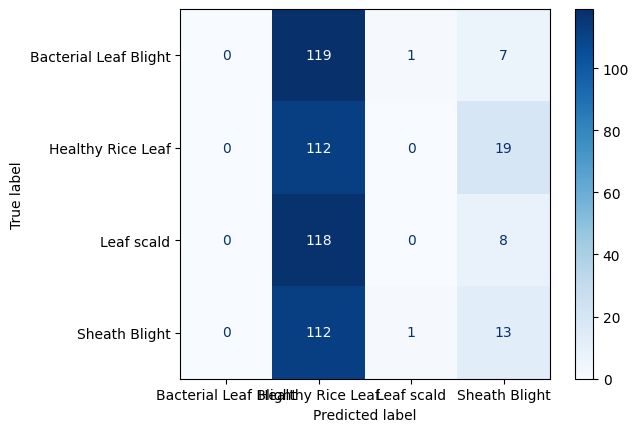

In [35]:
val_generator = datagen.flow_from_dataframe(
    val_df,
    x_col='filepath',
    y_col='label',
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Evaluate VGG16 model
print("\nVGG16 Model:")
evaluate_model(vgg16_model, val_generator)

Found 510 validated image filenames belonging to 4 classes.

InceptionV3 Model:


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


16/16 ━━━━━━━━━━━━━━━━━━━━ 15s 572ms/step

Classification Report:
                       precision    recall  f1-score   support

Bacterial Leaf Blight       0.00      0.00      0.00       127
    Healthy Rice Leaf       0.32      0.25      0.28       131
           Leaf scald       0.24      0.68      0.36       126
        Sheath Blight       0.48      0.18      0.26       126

             accuracy                           0.28       510
            macro avg       0.26      0.28      0.23       510
         weighted avg       0.26      0.28      0.23       510


Confusion Matrix:


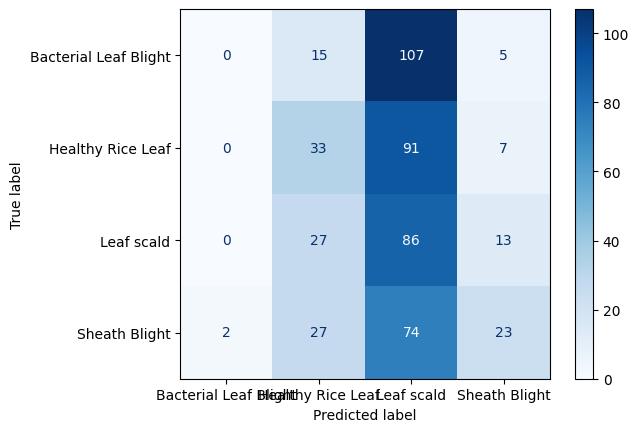

In [36]:
val_generator = datagen.flow_from_dataframe(
    val_df,
    x_col='filepath',
    y_col='label',
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Evaluate ResNet50 model
print("\nInceptionV3 Model:")
evaluate_model(inceptionv3_model, val_generator)

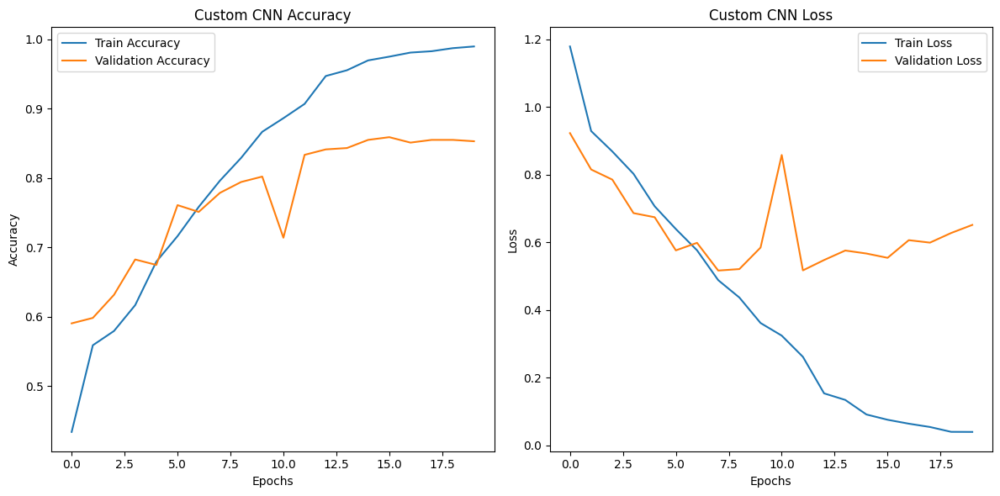

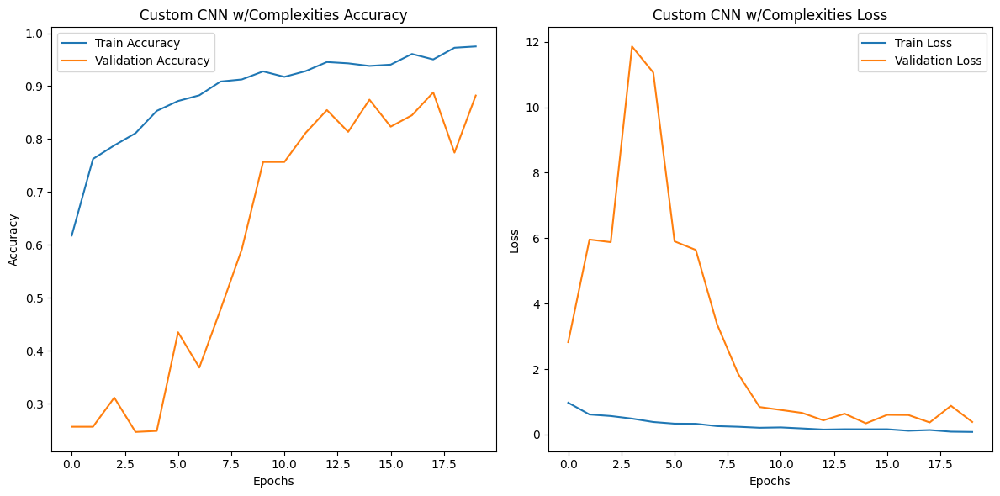

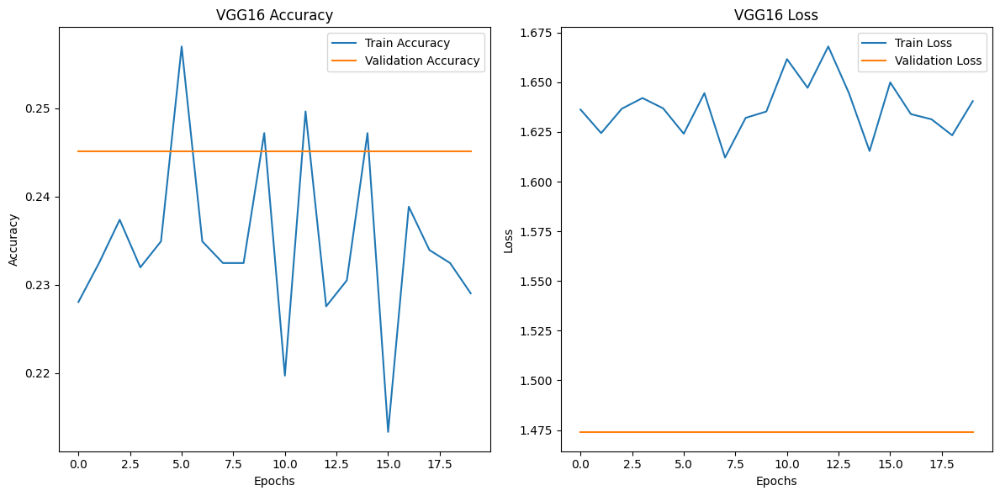

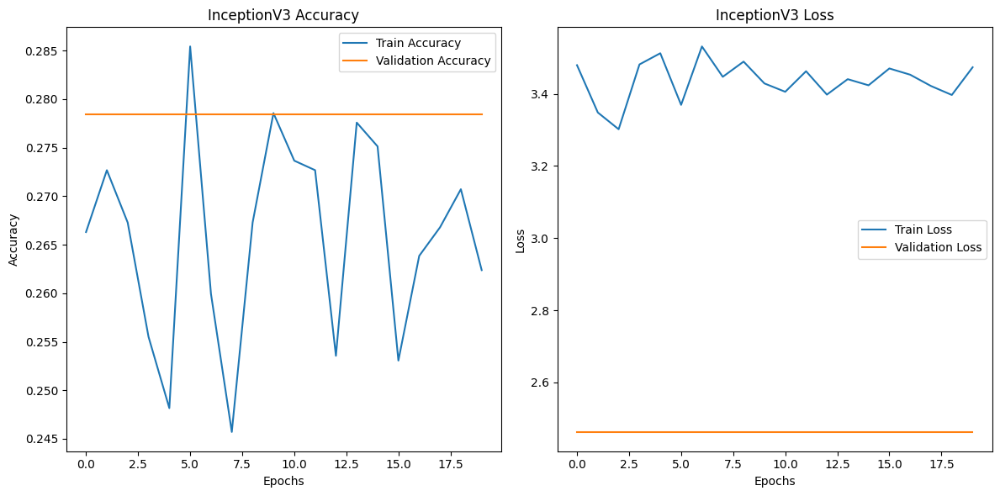

In [37]:
def plot_training_history(history, title):
    plt.figure(figsize=(12, 6))
    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{title} Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{title} Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot history
plot_training_history(history, "Custom CNN")
plot_training_history(history_custom_complex, "Custom CNN w/Complexities")
plot_training_history(history_vgg16, "VGG16")
plot_training_history(history_inceptionv3, "InceptionV3")

Both pretrained models have failed to perform even at a satisfactory level as the accuracy seems to remain under 50%. This means that the model performs worse than random guessing. Therefore, this model cannot be used in any real life situations. Also due to the two pretrained models underperforming, not a lot of pretrained models were explored as part of this research.<br>
The custom models seems to perform really well in comparison but requires further improvement to ensure they perform well in real world situations. This can be achieved by further fine tuning and processing the data and also potentially tuning the architecture - only after the data has been processed and tuned sufficiently. Using cleaner data can also improve potential results.
<br><br>
**Image Segmentation** is a technique that has not been applied but tested as part of EDA to understand if this can be applied with ease. Therefore, as next steps this can be applied to see if it further improves the accuracy of the model.